# Interpretability

- https://shap.readthedocs.io/en/latest/

In [1]:
#!pip install shap
#!pip install matplotlib
#!pip install --upgrade scikit-learn==1.2.0

In [17]:
import numpy as np
import pandas as pd
import random

from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import recall_score, f1_score, roc_auc_score
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from sklearn.impute import SimpleImputer
from tpot.export_utils import set_param_recursive

import shap
import matplotlib as plt
from tpot import TPOTRegressor
import pickle
from sklearn.cluster import KMeans
import warnings
import copy

shap.initjs()
pd.options.display.max_columns = None
warnings.filterwarnings('ignore') # disable warnings

In [2]:
# a custom function for performance metrics

def classification_metrics(y_true, y_pred):
    """A helper function for computing and printing
    several relevant classification metrics. 

    'weighted': Calculate metrics for each label, and find their average, 
    weighted by support (the number of true instances for each label).
    
    Args:
        y_true (np.array): actual labels
        y_pred (np.array): predicted labels
    Prints:
        All metrics on a separate line.      
    """
    accuracy = accuracy_score(y_true, y_pred)
    precision_weighted = precision_score(y_true, y_pred, average='weighted')
    recall_weighted = recall_score(y_true, y_pred, average = 'weighted')
    f1_score_weighted = f1_score(y_true, y_pred, average = 'weighted')
    roc_auc_weighted = roc_auc_score(y_true, y_pred, average = 'weighted')
    print(f'Accuracy: {accuracy}')
    print(f'Precision (weighted): {precision_weighted}')
    print(f'Recall (weighted): {recall_weighted}')
    print(f'F1-score (weighted): {f1_score_weighted}')
    print(f'ROC-AUC (weighted): {roc_auc_weighted}')

In [3]:
#import data
#download pickle models here:
#https://drive.google.com/file/d/1-gt9T40f8z37mAuE3j3WyeWAVoUhf_Gh/view?usp=sharing

X1_train = pd.read_pickle("./X1_train.pkl")
y1_train = pd.read_pickle("./y1_train.pkl")
X1_test = pd.read_pickle("./X1_val.pkl")
y1_test = pd.read_pickle("./y1_val.pkl")

X2_train = pd.read_pickle("./X2_train.pkl")  
y2_train = pd.read_pickle("./y2_train.pkl")
X2_test = pd.read_pickle("./X2_val.pkl")  
y2_test = pd.read_pickle("./y2_val.pkl")

X1_all = pd.read_pickle("./X1.pkl")  
X2_all = pd.read_pickle("./X2.pkl")  
y_all = pd.read_pickle("./target.pkl")

df_legend = pd.read_excel('df_project2.xlsx', sheet_name = 'data_dictionary') # load the data dictionary

In [4]:
print(X1_train.shape)
print(X1_test.shape)
print(y1_train.shape)
print(y1_test.shape)

(873, 61)
(219, 61)
(873,)
(219,)


In [5]:
print(X2_train.shape)
print(X2_test.shape)
print(y2_train.shape)
print(y2_test.shape)

(489, 86)
(210, 86)
(489,)
(210,)


In [6]:
print(X1_all.shape)
print(X2_all.shape)
print(y_all.shape)

(4323, 61)
(4323, 86)
(4323,)


## Model X1

In [4]:
#import tpot model
with open("./tpot_model_X1.pickle", "rb") as f:
    tpot_args = pickle.load(f)

tpot_x1 = TPOTRegressor(template=tpot_args["template"])
tpot_args["fitted_pipeline_"] = tpot_args["template"]
del tpot_args["template"]
for k, v in tpot_args.items():
    setattr(tpot_x1, k, v)

In [5]:
#create new test set by combining the left over data with the original test set
df = pd.concat([X1_all, X1_train])
df2 = df[df.index.duplicated(keep=False)]
X1_test_big = df.drop(df2.index)
df_y = pd.concat([y_all, y1_train])
df2_y = df_y[df_y.index.duplicated(keep=False)]
y1_test_big = df_y.drop(df2_y.index)

In [6]:
#predict the results
results_x1_train = tpot_x1.fitted_pipeline_.predict(X1_train.to_numpy())
results_x1_test = tpot_x1.fitted_pipeline_.predict(X1_test.to_numpy())
results_x1_test_big = tpot_x1.fitted_pipeline_.predict(X1_test_big.to_numpy())

In [11]:
tpot_x1.fitted_pipeline_

Pipeline(steps=[('stackingestimator',
                 StackingEstimator(estimator=ExtraTreesClassifier(max_features=0.9500000000000001,
                                                                  min_samples_leaf=7,
                                                                  min_samples_split=8,
                                                                  random_state=42))),
                ('xgbclassifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enabl...
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.001, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_delta_step=None, max_depth=9,
                               max_leaves=None, min_child_weight=9, missing=nan,
                               monotone_constraints=None, n_estimators=100,
                               n_jobs=1, num_parallel_tree=None, predictor=None,
                               random_state=42, ...))])

In [12]:
classification_metrics(y1_train, results_x1_train)
#on training data
print('SIZE', len(results_x1_train))

Accuracy: 0.9713631156930126
Precision (weighted): 0.9720739118837098
Recall (weighted): 0.9713631156930126
F1-score (weighted): 0.9715382252267241
ROC-AUC (weighted): 0.9716808924732551
SIZE 873


In [13]:
classification_metrics(y1_test, results_x1_test)
#on testing data
print('SIZE', len(results_x1_test))

Accuracy: 0.680365296803653
Precision (weighted): 0.69698745010195
Recall (weighted): 0.680365296803653
F1-score (weighted): 0.6878589237190801
ROC-AUC (weighted): 0.5851566098572087
SIZE 219


In [14]:
classification_metrics(y1_test_big, results_x1_test_big)
#on all the data that is not training data (originial test data + leftover data)
print('SIZE', len(results_x1_test_big))

Accuracy: 0.9008695652173913
Precision (weighted): 0.9484226883994418
Recall (weighted): 0.9008695652173913
F1-score (weighted): 0.9166940884763992
ROC-AUC (weighted): 0.8901015632462033
SIZE 3450


In [7]:
# create shap explainer and shap values
explainer_x1 = shap.KernelExplainer(tpot_x1.fitted_pipeline_.predict_proba, X1_train)
#shap_values_x1 = explainer_x1.shap_values(X1_train.values)

#pickle.dump(explainer_x1, open('explainer_x1.sav', 'wb'))
#pickle.dump(shap_values_x1, open('shap_values_x1.sav', 'wb'))

#explainer_x1 = pickle.load(open('explainer_x1.sav', 'rb'))
shap_values_x1 = pickle.load(open('shap_values_x1.sav', 'rb'))

Using 873 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


### Global

#### Feature Importances

The plot above takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

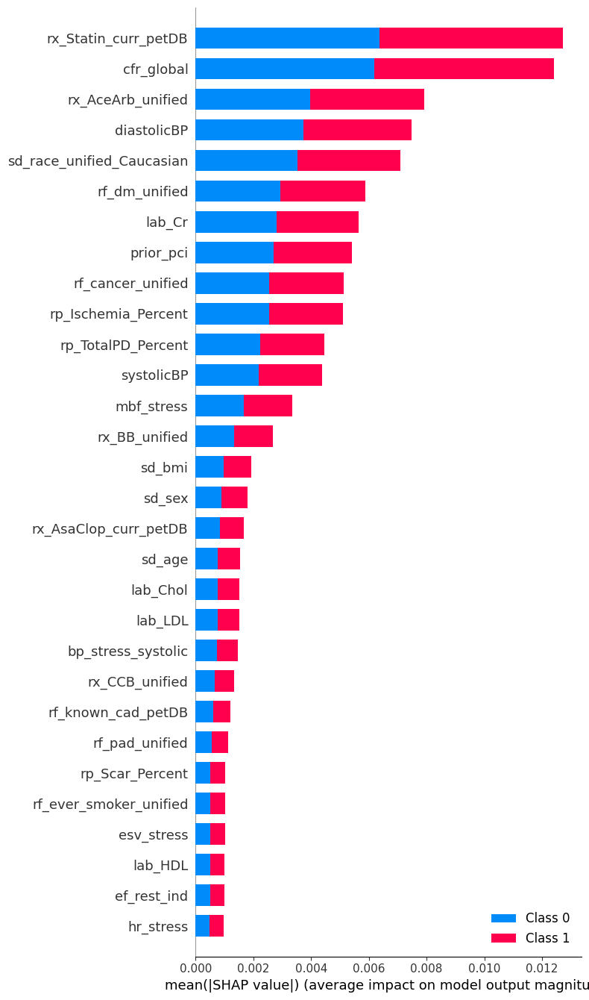

In [16]:
shap.summary_plot(shap_values_x1, X1_train, plot_type="bar", max_display = 30) # max_display = 60 shows all variables

#### SHAP Summary Plot

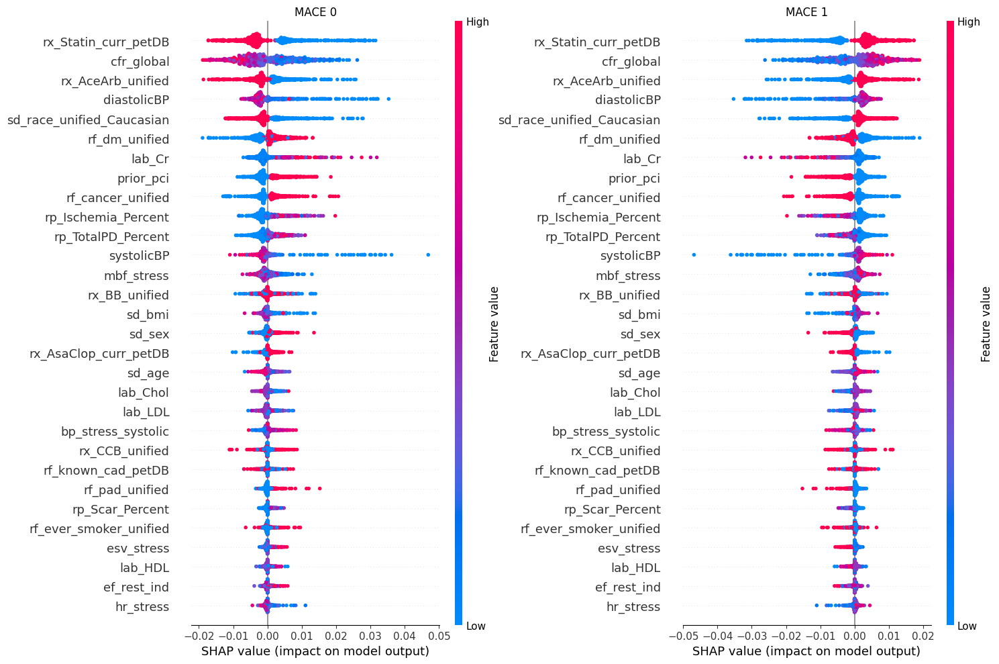

In [165]:
plt.pyplot.figure(figsize=(15,10))
plt.pyplot.subplot(1,2,1).set_title('MACE 0')
shap.summary_plot(shap_values_x1[1], X1_train, max_display = 30, plot_size=None, show=False)
plt.pyplot.subplot(1,2,2).set_title('MACE 1')
shap.summary_plot(shap_values_x1[0], X1_train, max_display = 30, plot_size=None, show=False)
plt.pyplot.show()

### Local

In [18]:
# mace predicted as 1
results_x1 = tpot_x1.fitted_pipeline_.predict(X1_train.to_numpy())
np.where(results_x1 == 1)

(array([  1,   3,   4,   7,   9,  11,  15,  16,  18,  19,  20,  21,  24,
         28,  40,  48,  52,  59,  66,  67,  68,  69,  70,  75,  76,  80,
         82,  90,  92,  98,  99, 101, 103, 111, 126, 130, 146, 154, 156,
        167, 171, 176, 178, 180, 181, 182, 183, 185, 190, 191, 195, 202,
        204, 205, 206, 207, 208, 209, 210, 211, 212, 215, 216, 220, 222,
        233, 241, 242, 243, 249, 250, 254, 261, 262, 264, 267, 269, 280,
        289, 292, 300, 306, 310, 312, 317, 319, 326, 328, 335, 337, 347,
        352, 354, 358, 359, 361, 365, 370, 373, 374, 375, 376, 382, 390,
        391, 395, 397, 401, 403, 407, 414, 417, 420, 425, 426, 428, 437,
        438, 439, 440, 442, 444, 451, 452, 456, 464, 465, 466, 469, 470,
        471, 474, 475, 476, 477, 482, 486, 491, 492, 493, 495, 500, 501,
        502, 503, 504, 510, 512, 516, 519, 522, 526, 528, 534, 537, 539,
        540, 541, 543, 544, 546, 547, 551, 554, 556, 557, 558, 561, 565,
        567, 573, 576, 577, 579, 585, 588, 589, 590

In [19]:
# actual values as 1
np.where(y1_train == 1)

(array([  1,   3,   7,   9,  11,  15,  16,  18,  19,  20,  21,  24,  28,
         33,  40,  42,  48,  52,  59,  66,  68,  69,  70,  75,  76,  80,
         82,  90,  92,  98,  99, 101, 103, 111, 126, 130, 146, 154, 156,
        167, 171, 176, 178, 180, 181, 182, 183, 185, 190, 191, 195, 202,
        204, 205, 206, 207, 208, 209, 210, 213, 215, 216, 220, 222, 233,
        241, 242, 243, 249, 250, 254, 262, 264, 267, 269, 280, 289, 292,
        300, 306, 310, 312, 317, 319, 326, 335, 337, 347, 352, 354, 358,
        359, 365, 370, 373, 374, 375, 376, 382, 390, 391, 395, 397, 401,
        403, 407, 414, 417, 420, 425, 428, 437, 438, 439, 440, 442, 444,
        451, 452, 456, 464, 465, 466, 469, 470, 474, 476, 477, 486, 491,
        492, 495, 500, 501, 502, 503, 504, 510, 516, 518, 519, 522, 526,
        528, 534, 537, 539, 540, 541, 543, 544, 546, 547, 551, 554, 556,
        557, 558, 561, 565, 567, 573, 576, 577, 579, 585, 588, 589, 590,
        596, 599, 601, 603, 607, 609, 610, 618, 622

SHAP gives an overview about which features were the most influential in the model taking the correct decision of predicting mace = 1 or mace = 0. The below explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the actual model output. Features pushing the prediction higher are shown in pink, those pushing the prediction lower are in blue.

In [166]:
# predicting mace = 1 when mace was 1
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][1,:], X1_train.iloc[1,:]) # using index x

In [167]:
# predicting mace = 1 when mace was 0
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[0][4,:], X1_train.iloc[4,:]) # using index x

In [171]:
# predicting mace = 0 when mace was 0
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][2,:],  X1_train.iloc[2,:]) # using index x

In [169]:
# predicting mace = 0 when mace was 1
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[1][33,:],  X1_train.iloc[33,:]) # using index x

#### Force plot for the first 1000 samples

In [24]:
# mace = 0
shap.initjs()
shap.force_plot(explainer_x1.expected_value[1], shap_values_x1[1][:1000,:],  X1_train.iloc[:1000,:])

In [25]:
# mace = 1
shap.initjs()
shap.force_plot(explainer_x1.expected_value[0], shap_values_x1[0][:1000,:],  X1_train.iloc[:1000,:])

### Group

How we aggregated the data for group level:
- Median: this was done for columns that had numeric variables.
- Mean: was done for columns sd_sex, pharm_stressor, race column dummies. Basically for categorical values that makes sense to compare when averaged. For example, as the sex has values 0 and 1 (meaning male/female), then getting the result 0.5 would mean that they are equal and if its is higher or lower we can interpret which way it leans and how much.
- Mode: Binary (Yes/No) columns. 

In [187]:
# extract columns to decide if aggregating is done with median, mean or mode
existing_columns_x1 = X1_train.columns

yes_no_cols_x1 = list(set(df_legend[df_legend['no_yes_vars']==1]['name_col']).intersection(existing_columns_x1))
uncategorized_cols = set(existing_columns_x1).difference(yes_no_cols_x1) # remove odd duplicates that are numeric and yes/no at the same time
numeric_cols_x1 = list(set(df_legend[df_legend['isnumeric']==1]['name_col']).intersection(uncategorized_cols))
other_cols_x1 = list(set(df_legend[(df_legend['no_yes_vars']==0) & (df_legend['isnumeric']==0)]['name_col']).intersection(uncategorized_cols))

# add dummy columns that are missing from previous lists
missing_cols_x1 = set(uncategorized_cols).difference(numeric_cols_x1).difference(yes_no_cols_x1).difference(other_cols_x1)

median_cols_x1 = [] + numeric_cols_x1
mode_cols_x1 = [] + yes_no_cols_x1
mean_cols_x1 = [] + list(missing_cols_x1) + other_cols_x1

In [188]:
df_results_x1 = pd.DataFrame(y1_train, columns = ['o_mace']).copy()
df_results_x1.reset_index(inplace = True, drop = True)
df_testing_x1 = pd.DataFrame(X1_train, columns = X1_train.columns).copy()

In [189]:
# combine results with features
combined1 = pd.concat([df_testing_x1, df_results_x1], axis=1)

In [190]:
# filter data takes in user given filters
# The expected input is a matrix where each array is a key, value pair
# Example of expected input [['sd_sex', 0],['sd_race_unified_Caucasian',1]]
# When grouping data the input is [['feature', (min, max)]

def filterData(data, filters):
    filtered_data = data.copy()
    for filter_pair in filters:
        key, value = filter_pair
        if isinstance(value, tuple):
            filtered_data = filtered_data[(filtered_data[key] >= value[0]) & (filtered_data[key] <= value[1])]
        else:
            filtered_data = filtered_data.loc[filtered_data[key] == value]
    return filtered_data
    
def getMaceArrays(data, filters):
    filtered = filterData(data, filters)

    mace0 = filtered[filtered['o_mace'] == 0]
    mace0 = mace0.drop('o_mace', axis = 1)
    mace1 = filtered[filtered['o_mace'] == 1]
    mace1 = mace1.drop('o_mace', axis = 1)
    return [mace0, mace1]

def getAggregatedData(data, median_cols, mode_cols, mean_cols):
    mace_median = data[median_cols].median()
    mace_mode = data[mode_cols].mode()
    mace_avg = data[mean_cols].mean()

    merged = pd.DataFrame(mace_median).T.join(mace_mode)
    merged = merged.join(pd.DataFrame(mace_avg).T)

    return merged
        
def createForcePlotProper(explainer, explainer_index, data, title):
    shap.initjs()
    print(title)
    shap_values = explainer.shap_values(data)
    display(shap.force_plot(explainer.expected_value[explainer_index], shap_values[explainer_index], data))

In [191]:
# select filters
test_filters1 = [['sd_sex', 0.0], ['lab_LDL', (60,70)], ['sd_age', (35, 70)]]

# 2 datasets: mace=0, mace=1
mace0_a, mace1_a = getMaceArrays(combined1, test_filters1)

In [192]:
# aggregate values for group level
mace_0_aggregated_x1 = getAggregatedData(mace0_a, median_cols_x1, mode_cols_x1, mean_cols_x1)
mace_1_aggregated_x1 = getAggregatedData(mace1_a, median_cols_x1, mode_cols_x1, mean_cols_x1)

In [193]:
# mace=0
createForcePlotProper(explainer_x1,1, mace_0_aggregated_x1, 'Mace 0')

Mace 0


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:30<00:00, 30.09s/it]


In [194]:
# mace=1
createForcePlotProper(explainer_x1,0, mace_1_aggregated_x1, 'Mace 1')

Mace 1


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:30<00:00, 30.33s/it]


In [35]:
from tkinter import *
from IPython.display import clear_output

window=Tk()
window.title('Group Interpretability Model X1')
window.geometry("900x300+10+10")
        
# Dropdown menu options

columns_copy1 = list(X1_train.columns.copy())
columns_copy1.insert(0, "none")
OPTIONS = columns_copy1

# tooltips for entry box 1
def values1(a):
    if clicked1.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=50)
    elif clicked1.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=50)
    elif clicked1.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)

# tooltips for entry box 2
def values2(a):
    if clicked2.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=100)          
    elif clicked2.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=100) 
    elif clicked2.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)    
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)

# tooltips for entry box 3      
def values3(a):
    if clicked3.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=150)
    elif clicked3.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=150)
    elif clicked3.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150) 
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)
        
#function to aggregate over the data based on the selections
def oki():
    if clicked2.get() == "none":
        if clicked1.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple]]
        else:
            test_filters = [[clicked1.get(), float(t1.get())]]
    elif clicked3.get() == "none":
        if clicked2.get() != "none" and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), tuple2]]
        elif clicked2.get() != "none" and "," in t2.get():
            tuple = (t2.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple]]
        elif clicked2.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple],[clicked2.get(), float(t2.get())]]
        else:
            test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())]]
    else:
        if clicked3.get() != "none" and "," in t3.get() and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), tuple1], [clicked2.get(), tuple2], [clicked3.get(), tuple3]]        
        elif clicked3.get() != "none" and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), tuple2], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t3.get() and "," in t2.get():
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple2], [clicked3.get(), tuple3]]
        elif clicked3.get() != "none" and "," in t3.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), float(t2.get())], [clicked3.get(), tuple3]]
        elif clicked3.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple],[clicked2.get(), float(t2.get())], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t2.get():
            tuple = (t2.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t3.get():
            tuple = (t3.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), float(t2.get())], [clicked3.get(), tuple]]    
        else:
            test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())], 
                        [clicked3.get(), float(t3.get())]]
                
    mace0, mace1 = getMaceArrays(combined1, test_filters) 
    mace_0_aggregated_x1 = getAggregatedData(mace0, median_cols_x1, mode_cols_x1, mean_cols_x1)
    mace_1_aggregated_x1 = getAggregatedData(mace1, median_cols_x1, mode_cols_x1, mean_cols_x1)
    
    label.config( text = test_filters )
    
    #comment out this line if you want to keep all the outputs
    clear_output(wait=True)
    
    createForcePlotProper(explainer_x1,1, mace_0_aggregated_x1, 'Mace 0 '+str(test_filters))
    createForcePlotProper(explainer_x1,0, mace_1_aggregated_x1, 'Mace 1 '+str(test_filters))
    
# datatype of menu text
clicked1 = StringVar(window)
clicked2 = StringVar(window)
clicked3 = StringVar(window)

# initial menu text
clicked1.set(OPTIONS[0])
clicked2.set(OPTIONS[0])
clicked3.set(OPTIONS[0])

# Create Dropdown menues
drop1 = OptionMenu( window , clicked1 , *OPTIONS, command=values1)
drop1.pack()
drop1.place(x=100, y=50)
drop2 = OptionMenu( window , clicked2 , *OPTIONS, command=values2)
drop2.pack()
drop2.place(x=100, y=100)
drop3 = OptionMenu( window , clicked3 , *OPTIONS, command=values3)
drop3.pack()
drop3.place(x=100, y=150)
        
#Create OK button
button = Button(window, text="OK", command=oki)
button.pack()
button.place(x=150, y=200)
        
#Create exit button
exit_button = Button(window, text="Exit", command=window.destroy)
exit_button.pack(pady=20)
exit_button.place(x=500, y=200)
        
#Create label info window
label = Label( window , text = " " )
label.pack()

#Create tooltip window
tooltip = Label( window , text = "to group data enter min,max values")
tooltip.pack()
tooltip.place(x=500, y=25)

#Create entry box info window
label_value = Label( window , text = " " )
label_value.pack()
    
#Create entry box windows for values
t1=Entry()
t2=Entry()
t3=Entry()
t1.place(x=500, y=50)
t2.place(x=500, y=100)
t3.place(x=500, y=150)

window.mainloop()

Mace 0 [['sd_age', (30, 60)], ['sd_bmi', (25, 35)], ['sd_race_unified_African-American', 1.0]]


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:28<00:00, 28.46s/it]


Mace 1 [['sd_age', (30, 60)], ['sd_bmi', (25, 35)], ['sd_race_unified_African-American', 1.0]]


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:28<00:00, 28.96s/it]


## Model X2

In [12]:
#import tpot model
with open("./tpot_model_X2.pickle", "rb") as f:
    tpot_args = pickle.load(f)

tpot_x2 = TPOTRegressor(template=tpot_args["template"])
tpot_args["fitted_pipeline_"] = tpot_args["template"]
del tpot_args["template"]
for k, v in tpot_args.items():
    setattr(tpot_x2, k, v)

In [13]:
#create new test set by combining the left over data with the original test set
df = pd.concat([X2_all, X2_train])
df2 = df[df.index.duplicated(keep=False)]
X2_test_big = df.drop(df2.index)
df_y = pd.concat([y_all, y2_train])
df2_y = df_y[df_y.index.duplicated(keep=False)]
y2_test_big = df_y.drop(df2_y.index)

In [14]:
#predict the results
results_x2_train = tpot_x2.fitted_pipeline_.predict(X2_train.to_numpy())
results_x2_test = tpot_x2.fitted_pipeline_.predict(X2_test.to_numpy())
results_x2_test_big = tpot_x2.fitted_pipeline_.predict(X2_test_big.to_numpy())

In [195]:
tpot_x2.fitted_pipeline_

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('stackingestimator',
                 StackingEstimator(estimator=XGBClassifier(base_score=None,
                                                           booster=None,
                                                           callbacks=None,
                                                           colsample_bylevel=None,
                                                           colsample_bynode=None,
                                                           colsample_bytree=None,
                                                           early_stopping_rounds=None,
                                                           enable_categorical=False,
                                                           eval_metric=None,
                                                           feature_types=None,
                                                           gamma=None,
                                                           gpu_id=None,
                                                           grow_policy=None,...
                                                           max_cat_to_onehot=None,
                                                           max_delta_step=None,
                                                           max_depth=1,
                                                           max_leaves=None,
                                                           min_child_weight=5,
                                                           missing=nan,
                                                           monotone_constraints=None,
                                                           n_estimators=100,
                                                           n_jobs=1,
                                                           num_parallel_tree=None,
                                                           predictor=None,
                                                           random_state=42, ...))),
                ('extratreesclassifier',
                 ExtraTreesClassifier(bootstrap=True, max_features=0.55,
                                      min_samples_leaf=4, min_samples_split=9,
                                      random_state=42))])

In [40]:
classification_metrics(y2_train, results_x2_train)
#on training data
print('SIZE', len(results_x2_train))

Accuracy: 0.8895705521472392
Precision (weighted): 0.8898847498029502
Recall (weighted): 0.8895705521472392
F1-score (weighted): 0.88935147569484
ROC-AUC (weighted): 0.8873784447659745
SIZE 489


In [41]:
classification_metrics(y2_test, results_x2_test)
#on testing data
print('SIZE', len(results_x2_test))

Accuracy: 0.8333333333333334
Precision (weighted): 0.8320501283205013
Recall (weighted): 0.8333333333333334
F1-score (weighted): 0.8317054662064577
ROC-AUC (weighted): 0.814903846153846
SIZE 210


In [42]:
classification_metrics(y2_test_big, results_x2_test_big)
#on all the data that is not training data (originial test data + leftover data)
print('SIZE', len(results_x2_test_big))

Accuracy: 0.8515910276473657
Precision (weighted): 0.936725927150586
Recall (weighted): 0.8515910276473657
F1-score (weighted): 0.881003153737052
ROC-AUC (weighted): 0.8417359433207018
SIZE 3834


In [15]:
# create shap explainer and shap values
explainer_x2 = shap.KernelExplainer(tpot_x2.fitted_pipeline_.predict_proba, X2_train)
#shap_values_x2 = explainer_x2.shap_values(X2_train)

#pickle.dump(explainer_x2, open('explainer_x2.sav', 'wb'))
#pickle.dump(shap_values_x2, open('shap_values_x2.sav', 'wb'))

#explainer_x2 = pickle.load(open('explainer_x2.sav', 'rb'))
shap_values_x2 = pickle.load(open('shap_values_x2.sav', 'rb'))

Using 489 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


### Global

#### Feature Importances

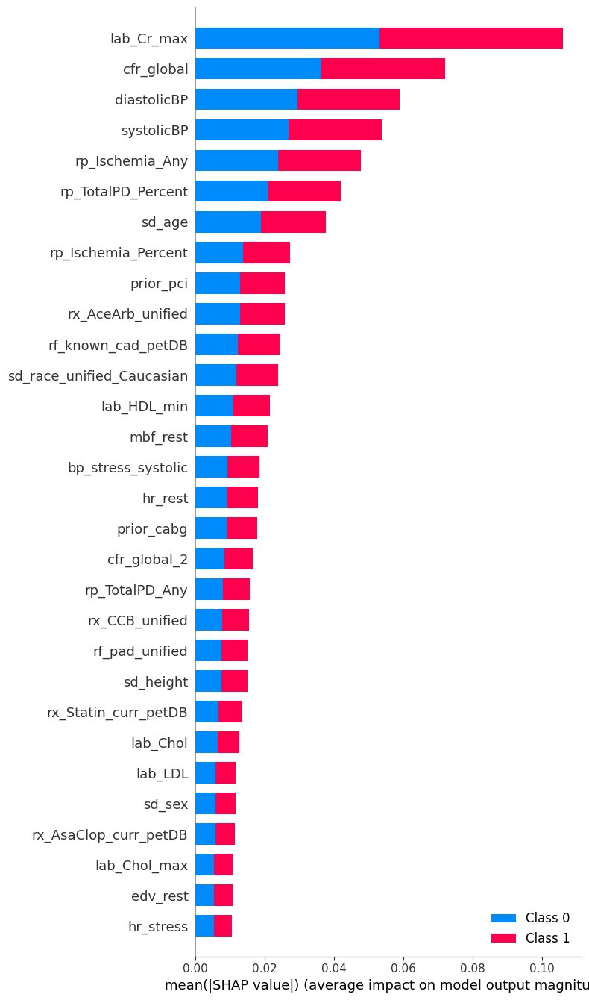

In [44]:
shap.summary_plot(shap_values_x2, X2_train, plot_type="bar", max_display = 30) # max_display = 60 shows all variables

#### SHAP Summary Plot

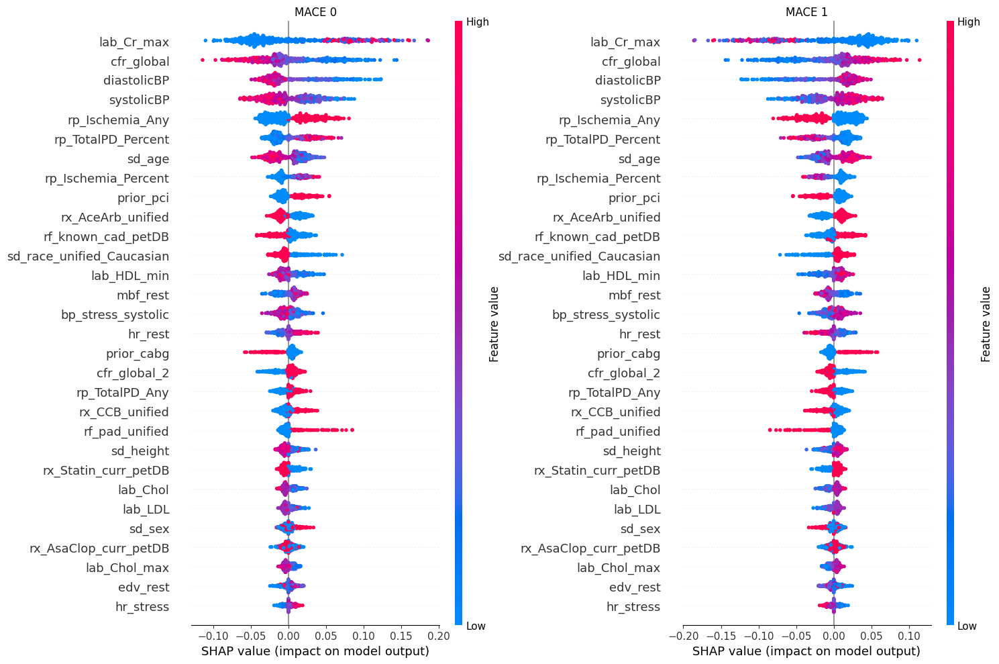

In [174]:
plt.pyplot.figure(figsize=(15,10))
plt.pyplot.subplot(1,2,1).set_title('MACE 0')
shap.summary_plot(shap_values_x2[1], X2_train, max_display = 30, plot_size=None, show=False)
plt.pyplot.subplot(1,2,2).set_title('MACE 1')
shap.summary_plot(shap_values_x2[0], X2_train, max_display = 30, plot_size=None, show=False)
plt.pyplot.show()

### Local

In [159]:
# mace predicted as 1
results_x2 = tpot_x2.fitted_pipeline_.predict(X2_train.to_numpy())
np.where(results_x2 == 1)

(array([  1,   3,   5,   6,   8,   9,  10,  11,  12,  16,  18,  20,  22,
         23,  25,  29,  31,  32,  34,  35,  38,  41,  43,  45,  46,  50,
         51,  54,  56,  66,  67,  69,  73,  74,  76,  79,  80,  81,  83,
         87,  88,  90,  92,  94,  99, 102, 103, 107, 109, 112, 118, 122,
        124, 125, 127, 132, 140, 144, 146, 147, 148, 150, 152, 155, 156,
        157, 158, 159, 160, 162, 164, 165, 169, 170, 172, 173, 175, 176,
        179, 195, 198, 199, 200, 201, 202, 203, 205, 207, 209, 212, 213,
        215, 216, 217, 220, 222, 223, 225, 226, 227, 230, 231, 235, 236,
        238, 239, 240, 241, 243, 245, 249, 250, 254, 255, 258, 262, 263,
        264, 266, 268, 271, 275, 276, 280, 281, 282, 283, 285, 287, 291,
        295, 296, 303, 307, 309, 310, 312, 313, 314, 316, 317, 318, 319,
        322, 325, 331, 333, 334, 338, 340, 341, 342, 346, 347, 349, 350,
        356, 358, 359, 360, 362, 364, 365, 366, 367, 370, 371, 374, 375,
        377, 378, 379, 385, 387, 390, 392, 393, 395

In [160]:
# actual values as 1
np.where(y2_train == 1)

(array([  1,   3,   5,   6,   8,  10,  11,  18,  20,  22,  23,  25,  29,
         31,  32,  37,  38,  41,  43,  45,  50,  51,  56,  60,  63,  66,
         67,  68,  69,  73,  76,  79,  80,  81,  83,  87,  88,  90,  91,
         92,  95, 102, 103, 105, 106, 107, 109, 112, 116, 118, 122, 124,
        125, 128, 132, 140, 144, 147, 148, 150, 151, 152, 156, 157, 158,
        159, 160, 162, 164, 165, 169, 170, 172, 173, 175, 177, 179, 182,
        190, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 207,
        209, 213, 216, 217, 219, 220, 222, 223, 225, 226, 227, 230, 231,
        235, 236, 238, 239, 240, 241, 243, 245, 249, 250, 254, 255, 256,
        258, 260, 262, 263, 264, 266, 268, 271, 272, 276, 278, 279, 280,
        281, 282, 283, 285, 287, 291, 295, 296, 303, 307, 309, 310, 312,
        313, 314, 316, 317, 318, 319, 321, 322, 324, 325, 328, 331, 333,
        334, 341, 342, 343, 345, 346, 347, 348, 349, 350, 354, 356, 358,
        359, 360, 362, 364, 365, 366, 367, 370, 371

In [175]:
# predicting mace = 1 when mace was 1
shap.initjs()
shap.force_plot(explainer_x2.expected_value[0], shap_values_x2[0][1,:], X2_train.iloc[1,:]) # using index x

In [176]:
# predicting mace = 1 when mace was 0
shap.initjs()
shap.force_plot(explainer_x2.expected_value[1], shap_values_x2[0][9,:], X2_train.iloc[9,:]) # using index x

In [177]:
# predicting mace = 0 when mace was 0
shap.initjs()
shap.force_plot(explainer_x2.expected_value[1], shap_values_x2[1][2,:],  X2_train.iloc[2,:]) # using index x

In [178]:
# predicting mace = 0 when mace was 1
shap.initjs()
shap.force_plot(explainer_x2.expected_value[0], shap_values_x2[1][37,:],  X2_train.iloc[37,:]) # using index x

#### Force plot for the first 1000 samples

In [172]:
# mace = 0
shap.initjs()
shap.force_plot(explainer_x2.expected_value[1], shap_values_x2[1][:1000,:],  X2_train.iloc[:1000,:])

In [173]:
# mace = 1
shap.initjs()
shap.force_plot(explainer_x2.expected_value[0], shap_values_x2[0][:1000,:],  X2_train.iloc[:1000,:])

### Group

In [179]:
# extract columns to decide if aggregating is done with median, mean or mode
existing_columns_x2 = X2_train.columns

custom_mode_cols_x2 = ['cac_cat', 'sd_bmi_cat']

custom_removed_x2 = set(existing_columns_x2).difference(custom_mode_cols_x2)
yes_no_cols_x2 = list(set(df_legend[df_legend['no_yes_vars']==1]['name_col']).intersection(custom_removed_x2))
uncategorized_cols_x2 = set(custom_removed_x2).difference(yes_no_cols_x2) # remove odd duplicates that are numeric and yes/no at the same time
numeric_cols_x2 = list(set(df_legend[df_legend['isnumeric']==1]['name_col']).intersection(uncategorized_cols_x2))
other_cols_x2 = list(set(df_legend[(df_legend['no_yes_vars']==0) & (df_legend['isnumeric']==0)]['name_col']).intersection(uncategorized_cols_x2))

# add dummy columns that are missing from previous lists
missing_cols_x2 = set(uncategorized_cols_x2).difference(numeric_cols_x2).difference(yes_no_cols_x2).difference(other_cols_x2)

median_cols_x2 = [] + numeric_cols_x2
mode_cols_x2 = [] + yes_no_cols_x2 + custom_mode_cols_x2
mean_cols_x2 = [] + list(missing_cols_x2) + other_cols_x2

In [180]:
df_results_x2 = pd.DataFrame(y2_train, columns = ['o_mace']).copy()
df_results_x2.reset_index(inplace = True, drop = True)
df_testing_x2 = pd.DataFrame(X2_train, columns = X2_train.columns).copy()

In [181]:
# combine results with features
combined2 = pd.concat([df_testing_x2, df_results_x2], axis=1)

In [182]:
# select filters
test_filters2 = [['sd_sex', 0.0], ['lab_LDL', (60,70)], ['sd_age', (35, 70)]]

# 2 datasets: mace=0, mace=1
mace0_b, mace1_b = getMaceArrays(combined2, test_filters2)

In [184]:
mace_0_aggregated_x2 = getAggregatedData(mace0_b, median_cols_x2, mode_cols_x2, mean_cols_x2)
mace_1_aggregated_x2 = getAggregatedData(mace1_b, median_cols_x2, mode_cols_x2, mean_cols_x2)

In [185]:
# mace=0
createForcePlotProper(explainer_x2,1, mace_0_aggregated_x2, 'Mace 0')

Mace 0


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:16<00:00, 16.50s/it]


In [186]:
# mace=1
createForcePlotProper(explainer_x2,0, mace_1_aggregated_x2, 'Mace 1')

Mace 1


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:16<00:00, 16.78s/it]


In [158]:
from tkinter import *
from IPython.display import clear_output

window=Tk()
window.title('Group Interpretability Model X2')
window.geometry("900x300+10+10")
        
# Dropdown menu options

columns_copy1 = list(X2_train.columns.copy())
columns_copy1.insert(0, "none")
OPTIONS = columns_copy1

# tooltips for entry box 1
def values1(a):
    if clicked1.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=50)
    elif clicked1.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=50)
    elif clicked1.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    elif clicked1.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)

# tooltips for entry box 2
def values2(a):
    if clicked2.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=100)          
    elif clicked2.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=100) 
    elif clicked2.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=100)
    elif clicked2.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=50)    
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)

# tooltips for entry box 3      
def values3(a):
    if clicked3.get() == "sd_sex":
        label_value.config( text = '0 = man | 1 = woman' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_bmi_cat":
        label_value.config( text = '1 = Underweight (<18.5kg/m2) \n 2 = Normal (18.5-25kg/m2) \n 3 = Overweight (25-30kg/m2)'+
                               '\n 4 = Obese (≥30kg/m2)')
        label_value.place(x=650, y=150)
    elif clicked3.get() == "cac_cat":
        label_value.config( text = '0 = CACS 0 \n 1 = CACS 1-99 \n 2 = CACS 100-399 \n 3 = CACS 400-999 \n 4 = CACS ≥1000')
        label_value.place(x=650, y=150)
    elif clicked3.get() == "rf_known_cad_petDB":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_age":
        label_value.config( text = 'age | age_min, age_max' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_American-Indian/Alaska Native":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Asian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Caucasian":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Native Hawaiian/Other Pacific Islander":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_Other/Unknown":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150)
    elif clicked3.get() == "sd_race_unified_African-American":
        label_value.config( text = '1 = yes | 0 = no' )
        label_value.place(x=650, y=150) 
    else:
        label_value.config( text = '' )
        label_value.place(x=600, y=200)
        
#function to aggregate over the data based on the selections
def oki():
    if clicked2.get() == "none":
        if clicked1.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple]]
        else:
            test_filters = [[clicked1.get(), float(t1.get())]]
    elif clicked3.get() == "none":
        if clicked2.get() != "none" and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), tuple2]]
        elif clicked2.get() != "none" and "," in t2.get():
            tuple = (t2.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple]]
        elif clicked2.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple],[clicked2.get(), float(t2.get())]]
        else:
            test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())]]
    else:
        if clicked3.get() != "none" and "," in t3.get() and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), tuple1], [clicked2.get(), tuple2], [clicked3.get(), tuple3]]        
        elif clicked3.get() != "none" and "," in t2.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), tuple2], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t3.get() and "," in t2.get():
            tuple2 = (t2.get().split(','))
            tuple2 = (int(tuple2[0]),int(tuple2[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple2], [clicked3.get(), tuple3]]
        elif clicked3.get() != "none" and "," in t3.get() and "," in t1.get():
            tuple1 = (t1.get().split(','))
            tuple1 = (int(tuple1[0]),int(tuple1[1]))
            tuple3 = (t3.get().split(','))
            tuple3 = (int(tuple3[0]),int(tuple3[1]))
            test_filters = [[clicked1.get(), tuple1],[clicked2.get(), float(t2.get())], [clicked3.get(), tuple3]]
        elif clicked3.get() != "none" and "," in t1.get():
            tuple = (t1.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), tuple],[clicked2.get(), float(t2.get())], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t2.get():
            tuple = (t2.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), tuple], [clicked3.get(), float(t3.get())]]
        elif clicked3.get() != "none" and "," in t3.get():
            tuple = (t3.get().split(','))
            tuple = (int(tuple[0]),int(tuple[1]))
            test_filters = [[clicked1.get(), float(t1.get())],[clicked2.get(), float(t2.get())], [clicked3.get(), tuple]]    
        else:
            test_filters = [[clicked1.get(), float(t1.get())], [clicked2.get(), float(t2.get())], 
                        [clicked3.get(), float(t3.get())]]
                
    mace0, mace1 = getMaceArrays(combined2, test_filters) 
    mace_0_aggregated_x2 = getAggregatedData(mace0, median_cols_x2, mode_cols_x2, mean_cols_x2)
    mace_1_aggregated_x2 = getAggregatedData(mace1, median_cols_x2, mode_cols_x2, mean_cols_x2)
    
    label.config( text = test_filters )
    
    #comment out this line if you want to keep all the outputs
    clear_output(wait=True)
    
    createForcePlotProper(explainer_x2,1, mace_0_aggregated_x2, 'Mace 0 '+str(test_filters))
    createForcePlotProper(explainer_x2,0, mace_1_aggregated_x2, 'Mace 1 '+str(test_filters))
    
# datatype of menu text
clicked1 = StringVar(window)
clicked2 = StringVar(window)
clicked3 = StringVar(window)

# initial menu text
clicked1.set(OPTIONS[0])
clicked2.set(OPTIONS[0])
clicked3.set(OPTIONS[0])

# Create Dropdown menues
drop1 = OptionMenu( window , clicked1 , *OPTIONS, command=values1)
drop1.pack()
drop1.place(x=100, y=50)
drop2 = OptionMenu( window , clicked2 , *OPTIONS, command=values2)
drop2.pack()
drop2.place(x=100, y=100)
drop3 = OptionMenu( window , clicked3 , *OPTIONS, command=values3)
drop3.pack()
drop3.place(x=100, y=150)
        
#Create OK button
button = Button(window, text="OK", command=oki)
button.pack()
button.place(x=150, y=200)
        
#Create exit button
exit_button = Button(window, text="Exit", command=window.destroy)
exit_button.pack(pady=20)
exit_button.place(x=500, y=200)
        
#Create tooltip window
tooltip = Label( window , text = "to group data enter min,max values")
tooltip.pack()
tooltip.place(x=500, y=25)    
    
#Create label info window
label = Label( window , text = " " )
label.pack()

#Create entry box info window
label_value = Label( window , text = " " )
label_value.pack()
    
#Create entry box windows for values
t1=Entry()
t2=Entry()
t3=Entry()
t1.place(x=500, y=50)
t2.place(x=500, y=100)
t3.place(x=500, y=150)

window.mainloop()

## Testing

In [140]:
def calc_separability(x_test, exp_fn):
    x_test.drop_duplicates(inplace=True)
    exp = exp_fn(x_test)
    wrong = 0
    for i in range(len(exp)):
        for j in range(len(exp)):
            if i == j:
                continue
            eq = exp[i]==exp[j]
            if eq.all():
                wrong = wrong + 1
    total = len(exp)
    score = 100*abs(wrong)/total**2
    return wrong,total,score

def calc_identity(exp1, exp2):
    dis = np.linalg.norm(np.array(exp1[0])-np.array(exp2[0]), axis = 1)
    total = dis.shape[0]
    true = np.where(abs(dis)<1e-8)[0].shape[0]
    score = (total-true)/total
    return score*100

def calc_stability_mace0(exp, labels):
    total = labels.shape[0]
    label_values = np.unique(labels)
    n_clusters = label_values.shape[0]
    exp = np.array(exp)
    init = np.array([[np.average(exp[0][np.where(labels == i)], axis = 0)] for i in label_values]).squeeze()
    ct = KMeans(n_clusters = n_clusters, random_state=1, n_init=10, init = init)
    ct.fit(exp[0])
    error = np.sum(np.abs(labels-ct.labels_))
    if error/total > 0.5:
        error = total-error
    return error, total

def calc_stability_mace1(exp, labels):
    total = labels.shape[0]
    label_values = np.unique(labels)
    n_clusters = label_values.shape[0]
    exp = np.array(exp)
    init = np.array([[np.average(exp[1][np.where(labels == i)], axis = 0)] for i in label_values]).squeeze()
    ct = KMeans(n_clusters = n_clusters, random_state=1, n_init=10, init = init)
    ct.fit(exp[1])
    error = np.sum(np.abs(labels-ct.labels_))
    if error/total > 0.5:
        error = total-error
    return error, total

In [196]:
%%time 
rng = np.random.default_rng(seed = 0)
exp_1_x1 = explainer_x1.shap_values(X1_test_big.iloc[rng.integers(0, 3450, size = 100)])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [53:42<00:00, 32.23s/it]

CPU times: total: 44min 31s
Wall time: 53min 42s


In [197]:
%%time 
rng = np.random.default_rng(seed = 0)
exp_2_x1 = explainer_x1.shap_values(X1_test_big.iloc[rng.integers(0, 3450, size = 100)])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [52:22<00:00, 31.43s/it]

CPU times: total: 43min 5s
Wall time: 52min 22s


In [141]:
%%time 
rng = np.random.default_rng(seed = 0)
exp_1_x2 = explainer_x2.shap_values(X2_test_big.iloc[rng.integers(0, 3834, size = 100)])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [28:27<00:00, 17.07s/it]

CPU times: total: 26min 26s
Wall time: 28min 27s


In [142]:
%%time 
rng = np.random.default_rng(seed = 0)
exp_2_x2 = explainer_x2.shap_values(X2_test_big.iloc[rng.integers(0, 3834, size = 100)])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [28:22<00:00, 17.02s/it]

CPU times: total: 25min 52s
Wall time: 28min 22s


In [91]:
pickle.dump(exp_1_x1, open('exp_1_x1.sav', 'wb'))
pickle.dump(exp_2_x1, open('exp_2_x1.sav', 'wb'))
pickle.dump(exp_1_x2, open('exp_1_x2.sav', 'wb'))
pickle.dump(exp_2_x2, open('exp_2_x2.sav', 'wb'))

In [140]:
exp_1_x1 = pickle.load(open('exp_1_x1.sav', 'rb'))
exp_2_x1 = pickle.load(open('exp_2_x1.sav', 'rb'))
#exp_1_x2 = pickle.load(open('exp_1_x2.sav', 'rb'))
#exp_2_x2 = pickle.load(open('exp_2_x2.sav', 'rb'))

### Model X1

In [200]:
print('calc_identity_X1')
print(calc_identity(exp_1_x1, exp_2_x1))
print('calc_stability_mace0_X1')
print(calc_stability_mace0(exp_1_x1, y1_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace0_X1')
print(calc_stability_mace0(exp_2_x1, y1_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace1_X1')
print(calc_stability_mace1(exp_1_x1, y1_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace1_X1')
print(calc_stability_mace1(exp_2_x1, y1_test_big.sample(n=100, random_state=1)))
print('calc_separability_X1')
print(calc_separability(X1_test_big.sample(n=100, random_state=1), explainer_x1.shap_values))

calc_identity_X1
100.0
calc_stability_mace0_X1
(23, 100)
calc_stability_mace0_X1
(23, 100)
calc_stability_mace1_X1
(23, 100)
calc_stability_mace1_X1
(23, 100)
calc_separability_X1


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [53:43<00:00, 32.24s/it]

(0, 2, 0.0)


In [ ]:
#from scipy.spatial.distance import cdist
#
#def calc_identity(exp1, exp2):
#    out = cdist(np.array(exp1[1]), np.array(exp2[1])zzzz, metric='euclidean')
#    total = out.shape[0]
#    true = np.where(abs(out)<1e-8)[0].shape[0]
#    print('true', true)
#    print('total', total)
#    score = (total-true)/total
#    return score*100

### Model X2

In [201]:
print('calc_identity_X2')
print(calc_identity(exp_1_x1, exp_2_x1))
print('calc_stability_mace0_X2')
print(calc_stability_mace0(exp_1_x2, y2_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace0_X2')
print(calc_stability_mace0(exp_2_x2, y2_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace1_X2')
print(calc_stability_mace1(exp_1_x2, y2_test_big.sample(n=100, random_state=1)))
print('calc_stability_mace1_X2')
print(calc_stability_mace1(exp_2_x2, y2_test_big.sample(n=100, random_state=1)))
print('calc_separability_X2')
print(calc_separability(X2_test_big.sample(n=100, random_state=1), explainer_x2.shap_values))

calc_identity_X2
100.0
calc_stability_mace0_X2
(38, 100)
calc_stability_mace0_X2
(31, 100)
calc_stability_mace1_X2
(38, 100)
calc_stability_mace1_X2
(31, 100)
calc_separability_X2


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [28:43<00:00, 17.23s/it]

(0, 2, 0.0)
